## Assignment 2  

In this assignment, the breast cancer dataset of sklearn library is used.  
Goal of current assignment is to use decision tree and random forest algorithms with varying parameter values to classify an entry as malignant or beneign breast mass.  
Model performance is evaluated through accuracy, recall, precision and F1-score.

### Brief dataset description  

The dataset consists of 569 entries of 30 numeric predictive variables and the outcome.  
Features are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image.   

#### Attribute information  
* radius (mean of distances from center to points on the perimeter)
* texture (standard deviation of gray-scale values)
* perimeter
* area
* smoothness (local variation in radius lengths)
* compactness (perimeter^2 / area - 1.0)
* concavity (severity of concave portions of the contour)
* concave points (number of concave portions of the contour)
* symmetry
* fractal dimension (“coastline approximation” - 1)

The mean, standard error, and “worst” or largest (mean of the three worst/largest values) of these features were computed for each image, resulting in 30 features. For instance, field 0 is Mean Radius, field 10 is Radius SE, field 20 is Worst Radius.  


As found on [sklearn documentation](https://scikit-learn.org/stable/datasets/index.html#breast-cancer-dataset)


In [1]:
import pandas as pd 
import numpy as np
from sklearn.datasets import load_breast_cancer
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
cancerDF = load_breast_cancer(as_frame=True)['frame']

In [3]:
print("Entries are split into two categories:")
print(f"There are {cancerDF[cancerDF['target']==0].target.count()} malignant entries and {cancerDF[cancerDF['target']==1].target.count()} benign entries.")

Entries are split into two categories:
There are 212 malignant entries and 357 benign entries.


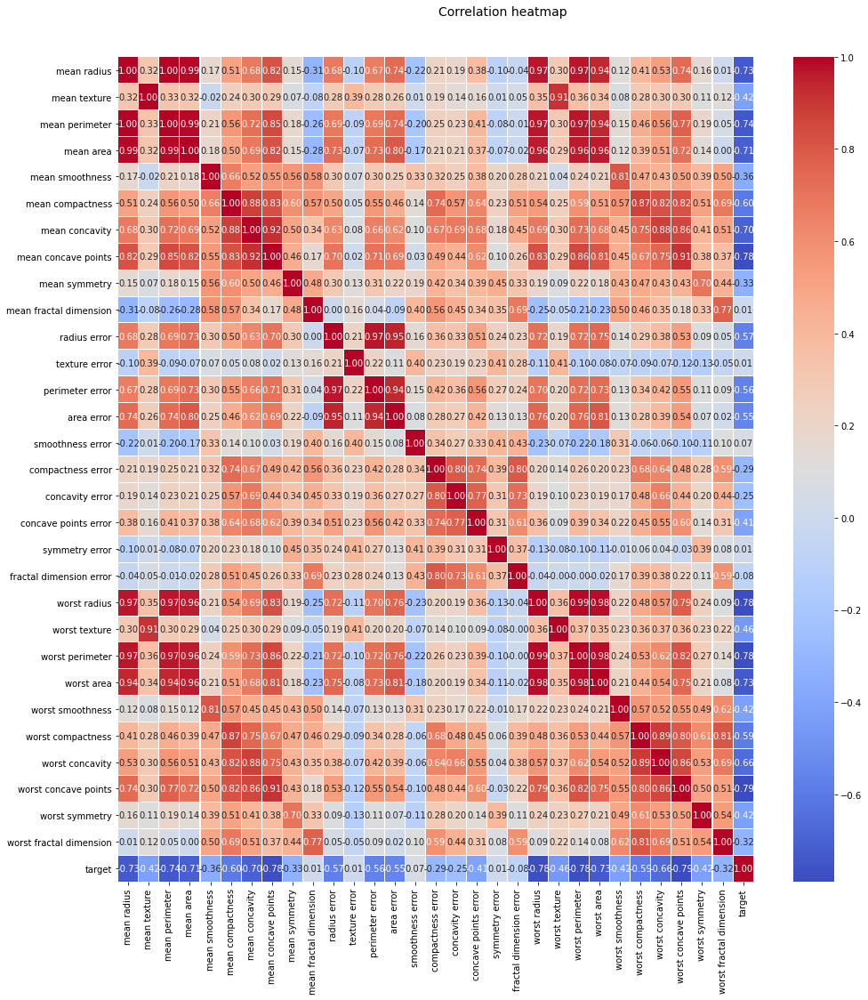

In [4]:
# Correlation Matrix Heatmap
f, ax = plt.subplots(figsize=(16, 16))

corr = cancerDF.corr()
hm = sns.heatmap(round(corr,2), annot=True, ax=ax, cmap="coolwarm", fmt='.2f', linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Correlation heatmap', fontsize=14)

Correlation between variables can be measured with a correlation coefficient. This coefficient ranges between -1 and 1. Values close to these numbers, indicate linear relationship. This means a change in one variable is associated with a significant change in other variables.  
This dataset appears to have many variables that are highly correlated with each other.  
Multicollinearity in features however, does not cause any troubles in non parametric models such as decision trees. Especially for decision trees, suppose we have three variables A, B and C with A and B being correlated with each other. If on a node variable A is choosen for a split, then no/little information can be gained from splitting on B. So it would typically get ignored in favor of C.  
Yet, for the purpose of this assignment, to limit the number of features, I will be manually selecting features that are not correlated with each other. (This could be achieved with techniques such as clustering but I consider these to be outside of the scope of this assignment).


In [5]:
selected_vars = ['mean radius', 'mean texture', 'mean smoothness', 'mean compactness',
       'mean symmetry', 'mean fractal dimension', 'radius error', 'texture error',
       'smoothness error', 'compactness error', 'symmetry error', 'worst symmetry', 
       'target']

In [6]:
cancerDF = cancerDF[selected_vars]

### Decision trees

In [7]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, make_scorer
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [8]:
params = {'criterion': ['gini', 'entropy'],
          'max_depth': range(2, 51),
          }
scoring = {'AUC': 'roc_auc',
           'Accuracy': make_scorer(accuracy_score),
           'Precision': make_scorer(precision_score),
           'Recall': make_scorer(recall_score),
           'F1': make_scorer(f1_score),
           }

In [9]:
X = cancerDF[[x for x in cancerDF.columns if x!='target']]
y = cancerDF['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [10]:
clf = DecisionTreeClassifier()

grid = GridSearchCV(clf, 
                    param_grid=params,
                    cv=5,
                    scoring=scoring, 
                    refit='AUC', 
                    return_train_score=True,
                    verbose=1,
                    n_jobs=-1)
grid.fit(X_train, y_train)

Fitting 5 folds for each of 98 candidates, totalling 490 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done 483 out of 490 | elapsed:   27.8s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 490 out of 490 | elapsed:   28.0s finished


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 51)},
             refit='AUC', return_train_score=True,
             scoring={'AUC': 'roc_auc', 'Accuracy': make_scorer(accuracy_score),
                      'F1': make_scorer(f1_score),
                      'Precision': make_scorer(precision_score),
                      'Recall': make_scorer(recall_score)},
             verbose=1)

In [11]:
results = pd.DataFrame(grid.cv_results_)

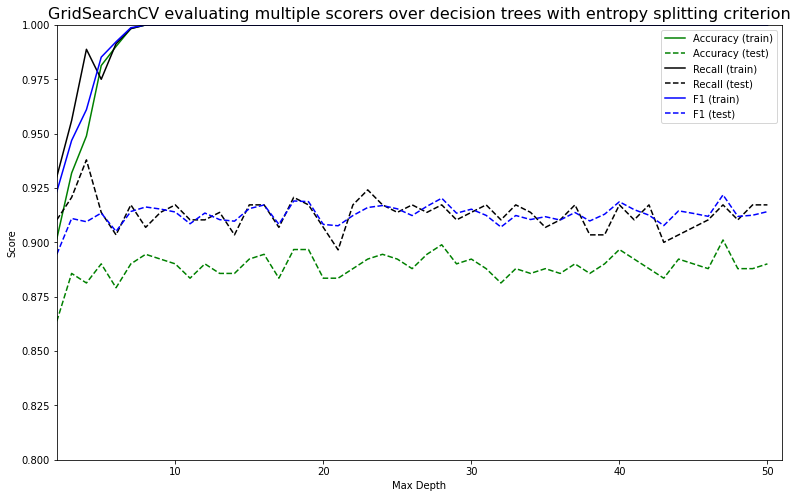

In [12]:
plt.figure(figsize=(13, 8))

plt.xlabel("Max Depth")
plt.ylabel("Score")

ax = plt.gca()
ax.set_xlim(2,51)
ax.set_ylim(0.8, 1)

colors = ['green','black','blue','red','yellow']
scores = ['Accuracy', 'Recall', 'F1']

#for crit in ['gini', 'entropy']:
crit = 'entropy'
res = results[results['param_criterion']== crit]

X_axis = np.array(res['param_max_depth'].tolist(), dtype=float)
for scorer, color in zip(scores, colors):
    for sample, style in (('train', '-'), ('test', '--')):
        sample_score_mean =res[f'mean_{sample}_{scorer}'].to_numpy()
        ax.plot(X_axis, sample_score_mean, style, color=color, label=f'{scorer} ({sample})')
        ax.legend(loc='upper right')
        plt.title(f'GridSearchCV evaluating multiple scorers over decision trees with {crit} splitting criterion', fontsize=16)
   


The values of the different metrics as the number of max depth changes are plotted above for both train and test set.  
It is apparent that the model is overfitting the data, as all metrics reach the value of 1 on train but not on test data.  
We can see the exact values looking on results.For example, for gini spliting criterion and max depth of 2,3,4,5,8,10,15,20 the following values are calculated:

In [13]:
crit='gini'
results.loc[(results['param_criterion']==crit) & (results['param_max_depth'].isin([2,3,4,5,8,10,15,20])),
            ['param_max_depth','mean_train_Accuracy','mean_test_Accuracy','mean_test_Precision',
            'mean_train_Precision','mean_test_Recall','mean_train_Recall','mean_test_F1','mean_train_F1']]

,param_max_depth,mean_train_Accuracy,mean_test_Accuracy,mean_test_Precision,mean_train_Precision,mean_test_Recall,mean_train_Recall,mean_test_F1,mean_train_F1
0,2,0.919231,0.874725,0.885623,0.918238,0.927586,0.959483,0.903567,0.937854
1,3,0.932967,0.887912,0.890183,0.917117,0.944828,0.984483,0.914223,0.949267
2,4,0.952198,0.890110,0.897482,0.958539,0.934483,0.968103,0.915182,0.962684
3,5,0.975824,0.894505,0.905331,0.976328,0.934483,0.986207,0.918155,0.981156
6,8,0.997802,0.887912,0.917488,0.999142,0.906897,0.997414,0.911315,0.998268
8,10,1.000000,0.890110,0.912527,1.000000,0.917241,1.000000,0.913586,1.000000
13,15,1.000000,0.901099,0.922310,1.000000,0.924138,1.000000,0.922090,1.000000
18,20,1.000000,0.907692,0.925698,1.000000,0.931034,1.000000,0.927314,1.000000


I will plot a tree for the best estimator, that is the estimator of max depth 5 and gini criterion

In [14]:
# train the best model 
clf = DecisionTreeClassifier(criterion='gini', max_depth=5)
clf.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5)

In [15]:
from sklearn import tree

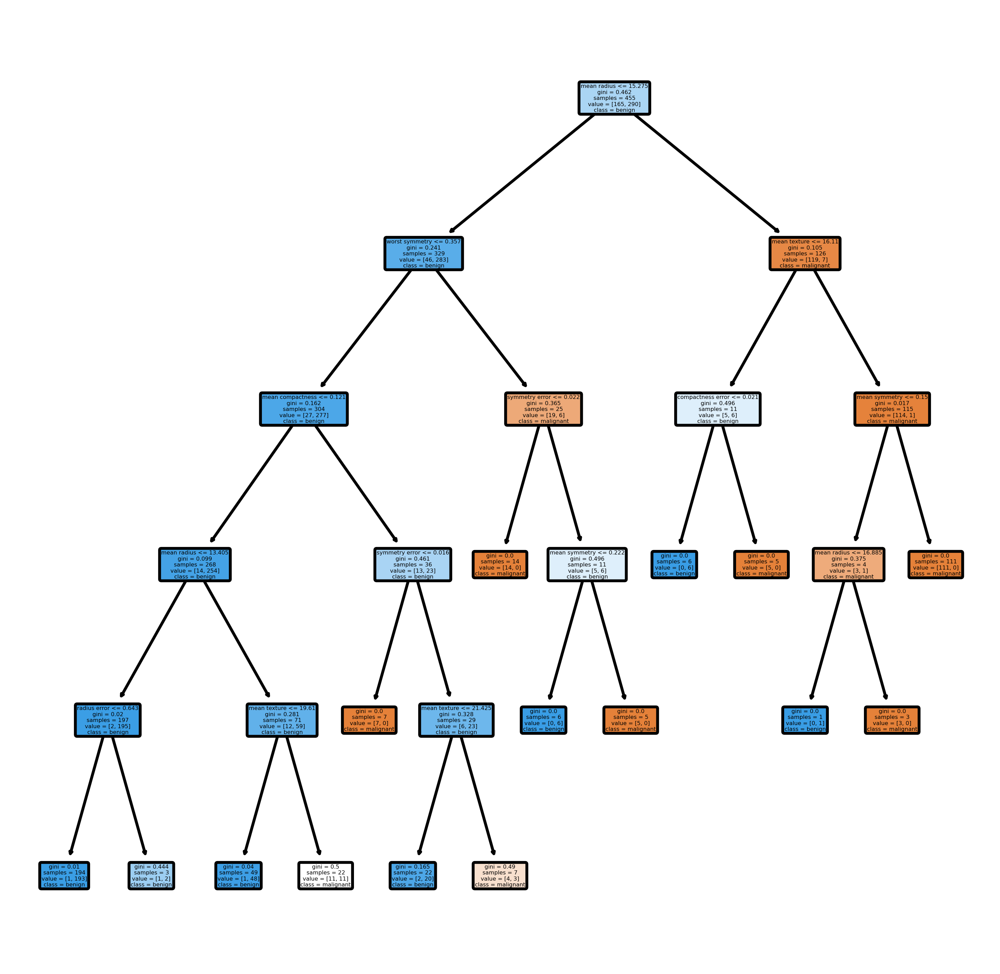

In [16]:
fn = [x for x in cancerDF.columns if x!='target']
cn = ["malignant", "benign"]

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (6,6), dpi=600)
tree.plot_tree(clf,
    feature_names=fn,
    class_names=cn,
    filled=True,
    rounded=True)
fig.savefig('decision_tree.png')

### Random Forest

In [17]:
from sklearn.ensemble import RandomForestClassifier

In [18]:
rf = RandomForestClassifier(criterion='gini',
                            n_estimators=100,
                            random_state=0)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

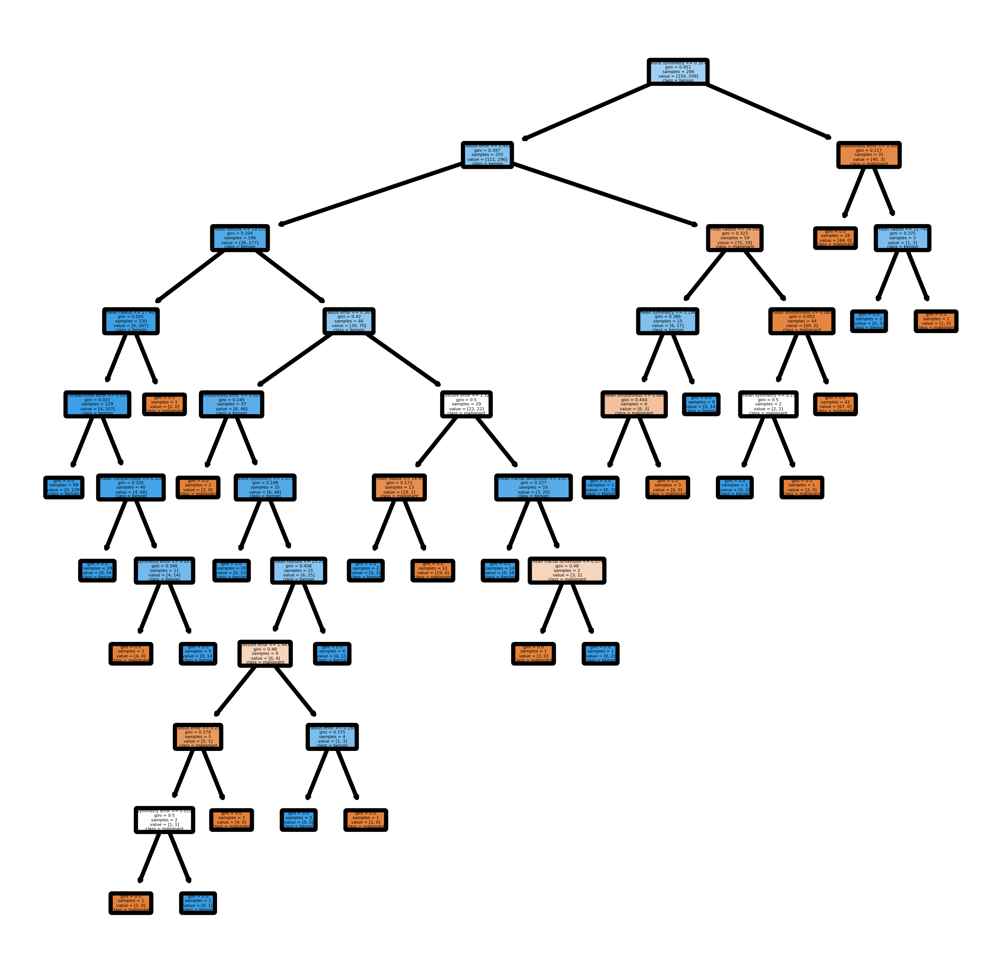

In [19]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(rf.estimators_[0],
               feature_names = fn, 
               class_names=cn,
               filled = True,
               rounded=True)
fig.savefig('rf_individualtree.png')

In [20]:
fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=3000)

for index in range(0, 5):
    tree.plot_tree(rf.estimators_[index],
                   feature_names = fn, 
                   class_names=cn,
                   filled = True,
                   ax = axes[index],
                   rounded=True)
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)

fig.savefig('rf_5trees.png')

In [21]:
params = {#'criterion': ['gini', 'entropy'],
          'n_estimators': range(1, 100),
          }

scoring = {'Accuracy': make_scorer(accuracy_score),
           'Precision': make_scorer(precision_score),
           'Recall': make_scorer(recall_score),
           'F1': make_scorer(f1_score),
           }

rf = RandomForestClassifier(criterion='gini')

grid = GridSearchCV(rf, 
                    param_grid=params,
                    cv=5,
                    scoring=scoring,
                    refit='Accuracy',
                    return_train_score=True,
                    verbose=1,
                    n_jobs=-1)
grid.fit(X_train, y_train)

Fitting 5 folds for each of 99 candidates, totalling 495 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:   50.3s
[Parallel(n_jobs=-1)]: Done 495 out of 495 | elapsed:  1.1min finished


GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'n_estimators': range(1, 100)}, refit='Accuracy',
             return_train_score=True,
             scoring={'Accuracy': make_scorer(accuracy_score),
                      'F1': make_scorer(f1_score),
                      'Precision': make_scorer(precision_score),
                      'Recall': make_scorer(recall_score)},
             verbose=1)

In [22]:
results = pd.DataFrame(grid.cv_results_)

Text(0.5, 1.0, 'F1-score')

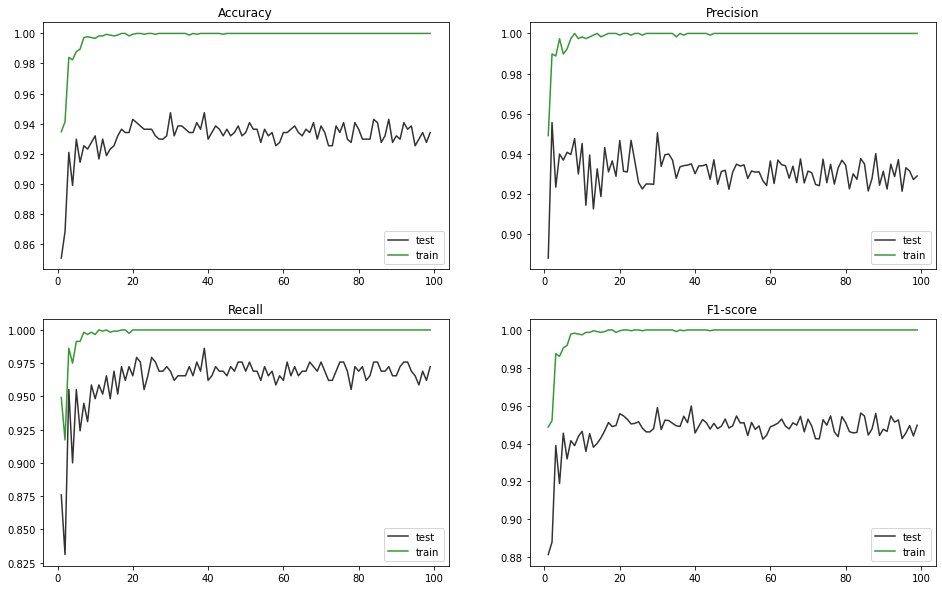

In [23]:
plt.figure(figsize=(16, 10))


scores = ['Accuracy', 'Precision', 'Recall', 'F1']
names = ['param_n_estimators'] + [x for x in results.columns if 'mean' in x and 'time' not in x]
res = results[names]


plt.subplot(221)
plt.plot(res['param_n_estimators'], res['mean_test_Accuracy'], color ='black', alpha=0.8, label='test')
plt.plot(res['param_n_estimators'], res['mean_train_Accuracy'], color='green', alpha=0.8, label='train')
plt.legend()
plt.title('Accuracy')

plt.subplot(222)
plt.plot(res['param_n_estimators'], res['mean_test_Precision'], color ='black', alpha=0.8, label='test')
plt.plot(res['param_n_estimators'], res['mean_train_Precision'], color='green', alpha=0.8, label='train')
plt.legend()
plt.title('Precision')

plt.subplot(223)
plt.plot(res['param_n_estimators'], res['mean_test_Recall'], color ='black', alpha=0.8, label='test')
plt.plot(res['param_n_estimators'], res['mean_train_Recall'], color='green', alpha=0.8, label='train')
plt.legend()
plt.title('Recall')

plt.subplot(224)
plt.plot(res['param_n_estimators'], res['mean_test_F1'], color ='black', alpha=0.8, label='test')
plt.plot(res['param_n_estimators'], res['mean_train_F1'], color='green', alpha=0.8, label='train')
plt.legend()
plt.title('F1-score')


It is clear that the model is overfitting on the train dataset, as the metrics on train data are higher than those on test data. Also, trees with >8 number of estimators appear to completely learn the relationship on train data, reaching accuracy score of 1.  
Results can be also found on the following table:

In [24]:
res.loc[res['param_n_estimators'].isin([2,4,6,8,10,15,20,50]), :]

,param_n_estimators,mean_test_Accuracy,mean_train_Accuracy,mean_test_Precision,mean_train_Precision,mean_test_Recall,mean_train_Recall,mean_test_F1,mean_train_F1
1,2,0.868132,0.941209,0.955663,0.989815,0.831034,0.917241,0.887997,0.952082
3,4,0.898901,0.982418,0.939994,0.997353,0.900000,0.975000,0.918899,0.986043
5,6,0.914286,0.989560,0.940870,0.992289,0.924138,0.991379,0.931920,0.991802
7,8,0.923077,0.997802,0.947676,1.000000,0.931034,0.996552,0.938904,0.998270
9,10,0.931868,0.996703,0.945288,0.998280,0.948276,0.996552,0.946495,0.997406
14,15,0.925275,0.998352,0.918821,0.998291,0.968966,0.999138,0.943043,0.998710
19,20,0.942857,0.999451,0.946745,0.999142,0.965517,1.000000,0.955777,0.999570
49,50,0.934066,1.000000,0.931050,1.000000,0.968966,1.000000,0.949398,1.000000
